<a href="https://colab.research.google.com/github/eunhyeme/2025-S1-CV/blob/main/2025_s1_CV_hw2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# HW#2-1
- Fig3.9(a) 영상에 대해 오른쪽과 같은 결과가
나오도록 여러가지 경우에 대해 실험하고, 결과
를 분석해보세요.



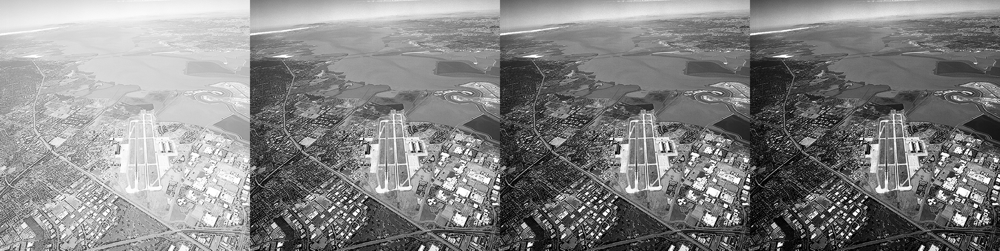

In [132]:
# 감마는 즉 대비로,
# 이 gamma값이 증가함에 따라, 사진속 대비가 심해짐을 알 수 있었다.
#그리고 그의 변화는 기하급수적으로 변함을 방정식을 통해 알 수 있었다.
from google.colab import files

import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

img_path = '/content/drive/MyDrive/Colab Notebooks/CV/img/Fig0309(a)(washed_out_aerial_image).tif'
img = cv.imread(img_path, cv.IMREAD_GRAYSCALE)

def gamma(f, gamma=1.0):
    f1 = f / 255.0
    return np.uint8(255 * (f1 ** gamma))

gc = np.hstack(( gamma(img, 1.0), gamma(img, 3.0), gamma(img, 4.0), gamma(img, 5.0)))
cv2_imshow(gc)




---



# HW#2-2
- Fig3.10(a) 영상에 대해 오른쪽과 같은 결과
가 나오도록 여러가지 경우에 대해 실험하고,
결과를 분석해보세요.

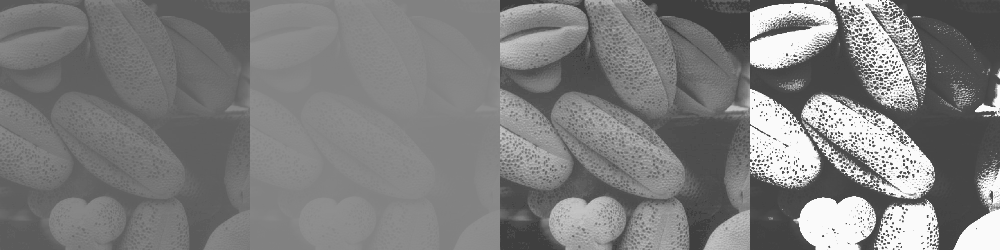

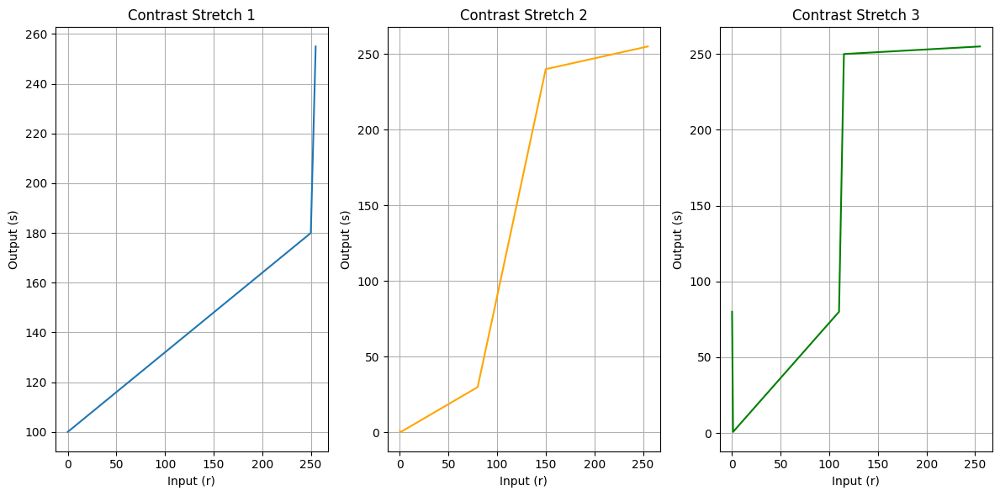

In [133]:
import matplotlib.pyplot as plt
import numpy as np
import cv2 as cv
from google.colab.patches import cv2_imshow

# 이미지 불러오기
img_path = '/content/drive/MyDrive/Colab Notebooks/CV/img/Fig0310(b)(washed_out_pollen_image).tif'
img = cv.imread(img_path, cv.IMREAD_GRAYSCALE)
img_array = np.array(img)

# 대비 확장 함수들
def contrast_stretch1(r):
    L = 256
    r1, s1 = 0, 100
    r2, s2 = 250, 180
    if r == 0:
        return s1
    elif r <= r1:
        return (s1 / r1) * r
    elif r <= r2:
        return ((s2 - s1) / (r2 - r1)) * (r - r1) + s1
    else:
        return ((L - 1 - s2) / (L - 1 - r2)) * (r - r2) + s2

def contrast_stretch2(r):
    L = 256
    r1, s1 = 80, 30
    r2, s2 = 150, 240
    if r == 0:
        return 1
    elif r <= r1:
        return (s1 / r1) * r
    elif r <= r2:
        return ((s2 - s1) / (r2 - r1)) * (r - r1) + s1
    else:
        return ((L - 1 - s2) / (L - 1 - r2)) * (r - r2) + s2

def contrast_stretch3(r):
    L = 256
    r1, s1 = 110, 80
    r2, s2 = 115, 250
    if r == 0:
        return s1
    elif r <= r1:
        return (s1 / r1) * r
    elif r <= r2:
        return ((s2 - s1) / (r2 - r1)) * (r - r1) + s1
    else:
        return ((L - 1 - s2) / (L - 1 - r2)) * (r - r2) + s2

# 대비 확장 적용
T1 = np.vectorize(contrast_stretch1)
adjusted1 = T1(img_array).astype(np.uint8)

T2 = np.vectorize(contrast_stretch2)
adjusted2 = T2(img_array).astype(np.uint8)

T3 = np.vectorize(contrast_stretch3)
adjusted3 = T3(img_array).astype(np.uint8)

# 이미지 이어붙이기
combined = np.hstack((img_array, adjusted1, adjusted2, adjusted3))
cv2_imshow(combined)

# 그래프 시각화용 데이터 생성
r_values = np.arange(256)
y1_values = [contrast_stretch1(r) for r in r_values]
y2_values = [contrast_stretch2(r) for r in r_values]
y3_values = [contrast_stretch3(r) for r in r_values]

# 그래프 출력
plt.figure(figsize=(12, 6))

plt.subplot(1, 3, 1)
plt.plot(r_values, y1_values, label="contrast_stretch1")
plt.title("Contrast Stretch 1")
plt.xlabel("Input (r)")
plt.ylabel("Output (s)")
plt.grid(True)

plt.subplot(1, 3, 2)
plt.plot(r_values, y2_values, label="contrast_stretch2", color="orange")
plt.title("Contrast Stretch 2")
plt.xlabel("Input (r)")
plt.ylabel("Output (s)")
plt.grid(True)

plt.subplot(1, 3, 3)
plt.plot(r_values, y3_values, label="contrast_stretch3", color="green")
plt.title("Contrast Stretch 3")
plt.xlabel("Input (r)")
plt.ylabel("Output (s)")
plt.grid(True)

plt.tight_layout()
plt.show()

# 분석
# 좌측의 r1,s1는 어두운 부분, 우측의 r2,s2는 밝은 부분을 조절하는
# 점으로 생각하며 값을 조정햇다.
# 더 수월한 조정을 위해 plt를 통해 그래프를 출력해가며 조정했다
# 이 두점이 가까울 수록, 영상의 이진화가 심해지고, 이 두점이 어디에 쏠리느냐에 따라
# 출력값이 어둡게, 밝게 결정이 됨을 분석할 수 있었다.


# HW#2-3
- 임의의 영상을 입력 받아 아래와 같은 마스크를 사용하여 컨볼루션 하고, 그 결과를 분석해보세요.

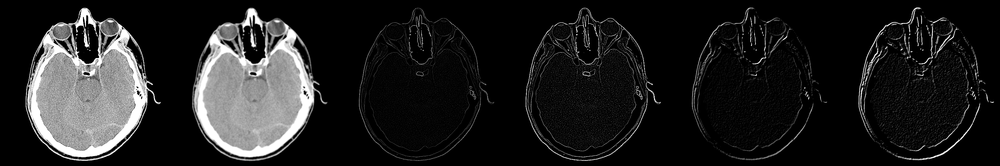

In [134]:

import cv2
import numpy as np
from google.colab.patches import cv2_imshow  # Colab에서 이미지 출력용

# 이미지 불러오기 (흑백)
img_path = '/content/drive/MyDrive/Colab Notebooks/CV/img/CTimg.tif'
img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

# 컨볼루션 마스크 정의 (모두 float32로 통일)
mask1 = np.array([[0, -1, 0],
                  [-1, 5, -1],
                  [0, -1, 0]], dtype=np.float32)  # 엣지 강조

mask2 = np.array([[0.0030, 0.0133, 0.0219, 0.0133, 0.0030],
                  [0.0133, 0.0596, 0.0983, 0.0596, 0.0133],
                  [0.0219, 0.0983, 0.1621, 0.0983, 0.0219],
                  [0.0133, 0.0596, 0.0983, 0.0596, 0.0133],
                  [0.0030, 0.0133, 0.0219, 0.0133, 0.0030]], dtype=np.float32)  # 가우시안 블러

mask3 = np.array([[0, -1, 0],
                  [-1, 4, -1],
                  [0, -1, 0]], dtype=np.float32)  # 소벨 엣지


mask4 = np.array([[-1, -1, -1],
                  [-1, 8, -1],
                  [-1, -1, -1]], dtype=np.float32)  # 샤프닝

mask5 = np.array([[-1, 0,0],
                  [0,0,0],
                  [0, 0,1]], dtype=np.float32)  # 좌상우하


mask6 = np.array([[-1, -1, 0],
                  [-1,  0, 1],
                  [ 0,  1, 1]], dtype=np.float32)  # 엣지 필터

# 컨볼루션 적용
def apply_and_normalize(img, kernel):
    filtered = cv2.filter2D(img, -1, kernel)
    normalized = cv2.normalize(filtered, None, 0, 255, cv2.NORM_MINMAX)
    return normalized.astype(np.uint8)

img_convoluted1 = apply_and_normalize(img, mask1)
img_convoluted2 = apply_and_normalize(img, mask2)
img_convoluted3 = apply_and_normalize(img, mask3)
img_convoluted4 = apply_and_normalize(img, mask4)
img_convoluted5 = apply_and_normalize(img, mask5)
img_convoluted6 = apply_and_normalize(img, mask6)

# 결과 이미지 수평 결합 후 출력
combined = np.hstack((img_convoluted1, img_convoluted2, img_convoluted3,
                      img_convoluted4, img_convoluted5, img_convoluted6))
cv2_imshow(combined)

#결과 분석
#참고: 강의자료 및 검색
#mask1: 엣지 강조- 윤곽 강조
#mask2: 가우시안 블러-노이즈제거와 부드러운 흐림효과
#mask3: 라플라시안- 수직과 수평엣지를 감지
#mask4: 샤프닝-강력한 라플라시안 마스크로 윤곽선 중에서도 중심을 강조한다
#mask5: 좌상우하의 대각선 윤곽선을 감지
#mask6: 수평과 수직의 대각선을 감지


#HW#2-4
- 아래와 같은 영상에 대하여 45°, -45° 방향의 대각선 edge를 검출하되, Sobel 연산자를 변형하여 적절한 마스크를
만들어 적용해보세요

45도 방향 엣지


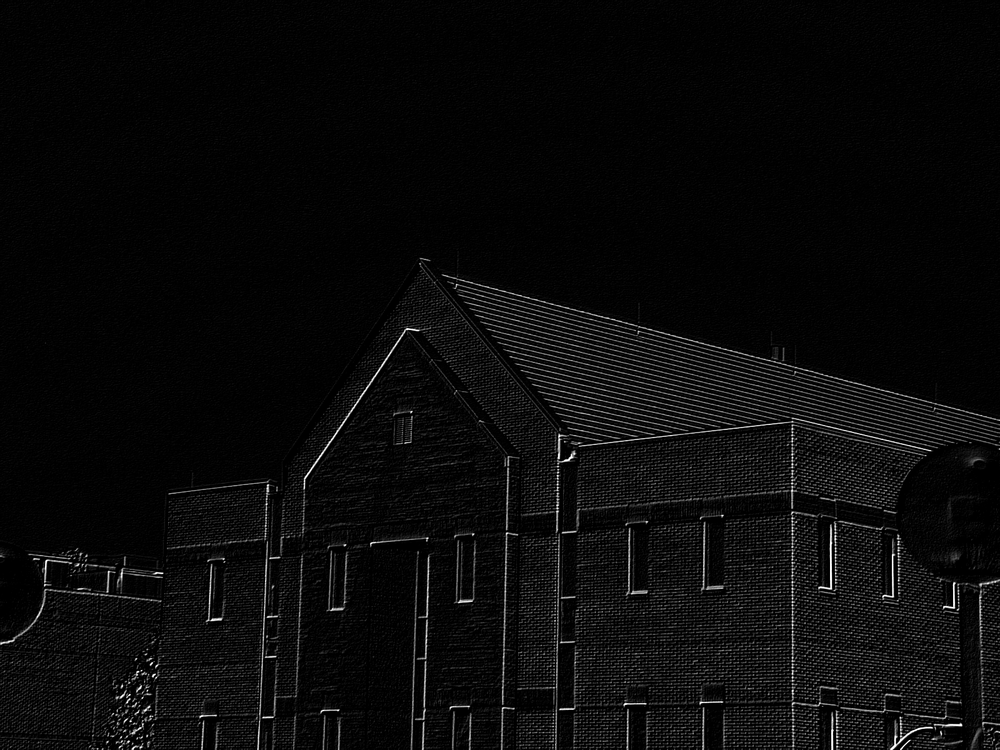

-45도 방향 엣지


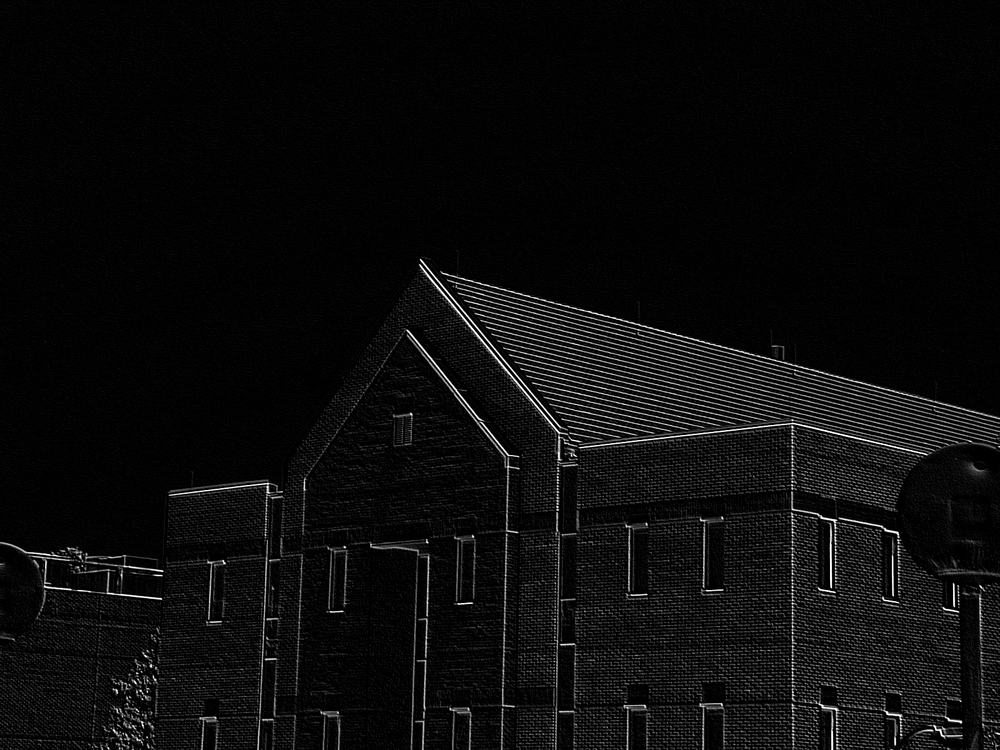

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

img_path = '/content/drive/MyDrive/Colab Notebooks/CV/img/school.jpg'
img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

# Sobel 마스크
#45도는 우하 좌상
mask45 = np.array([
    [-2, -1,  0],
    [-1,  0,  1],
    [ 0,  1,  2]
], dtype=np.float32)

#-45도는 우상 좌하
mask_45 = np.array([
    [ 0,  1,  2],
    [-1,  0,  1],
    [-2, -1,  0]
], dtype=np.float32)

# 필터 및 정규화
def filter(img, kernel):
    ft = cv2.filter2D(img, -1, kernel)
    normalized = cv2.normalize(ft, None, 0, 255, cv2.NORM_MINMAX)
    return normalized.astype(np.uint8)

# 마스크 적용
img45 = filter(img, mask45)
img_45 = filter(img, mask_45)

# 결과 출력
print("45도 방향 엣지")
cv2_imshow(img45)

print("-45도 방향 엣지")
cv2_imshow(img_45)


# HW#2-5
- 왼쪽의 지문영상을 오른쪽 영상과 같이 개선해보세요. 수업시간에 배운 방법을 기본적으로 적용해보고, 더 좋은 방
법이 있으면 해당 방법도 적용하고 결과를 분석해보세요.


원본영상


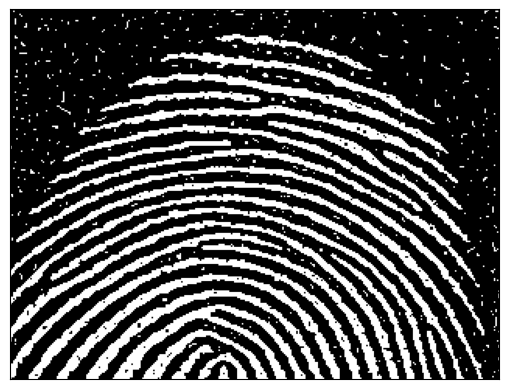


침식(erosiom) : A-B 


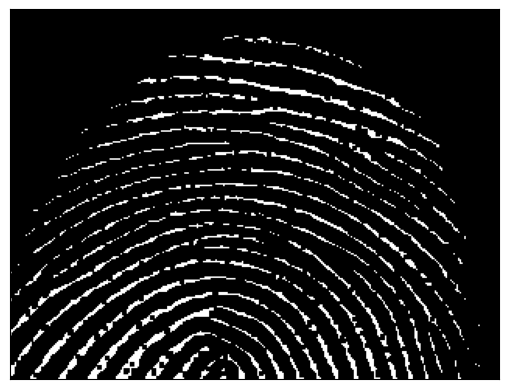


팽창(dilate) : (A-B)+B


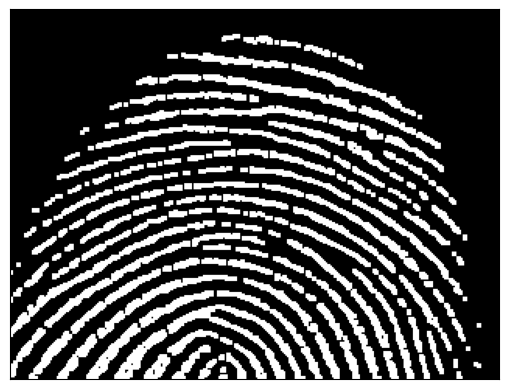


팽창(dilate) : ((A-B)+B)+B


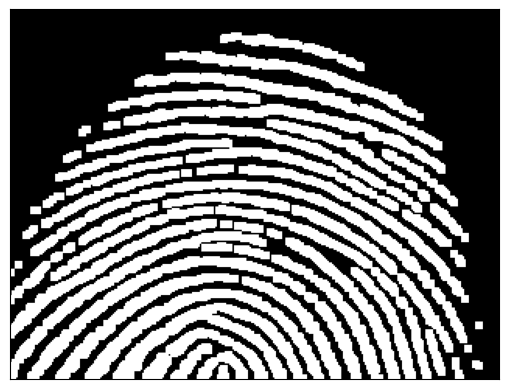


침식(erosiom) : (((A-B)+B)+B)-B 


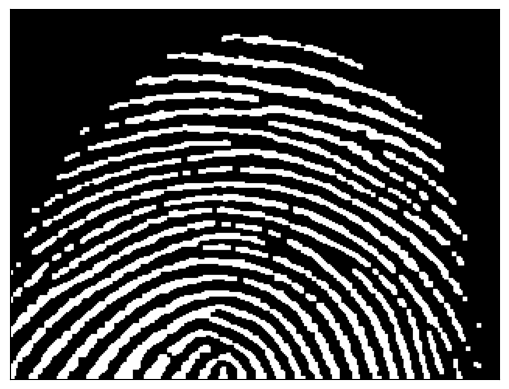

In [ ]:
# 강의자료에서 소개한 ((((A-B)+B)+B)-B 연산을 활용해 보았더니 잘 나왔다.
# 만약 지문에서 어떤 feature가 검출되어야 하는지 알았다면 다른 feature가 더 잘 검출되는 방법으로 진행해 볼까했는데,
# 이미 기존의 방법이 잘 나와서 더이상의 방법은 진행하지 않았다.

import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img_path='/content/drive/MyDrive/Colab Notebooks/CV/img/finger.jpg'

img=cv.imread(img_path,cv.IMREAD_UNCHANGED)


print("\n원본영상")
# 효율적인 영상개선을 위해 영상 이진화 진행(with OTSU)
t,bin_img=cv.threshold(img[:,:],0,255,cv.THRESH_BINARY+cv.THRESH_OTSU)
plt.imshow(bin_img,cmap='gray'),plt.xticks([]),plt.yticks([])
plt.show()


# 강의자료 방법대로 마스크 형성
se = np.uint8([ [1,1,1],
                [1,1,1],
                [1,1,1] ])

print("\n침식(erosiom) : A-B ")
bin_img=cv.erode(bin_img,se,iterations=1)	# 침식
plt.imshow(bin_img,cmap='gray'), plt.xticks([]), plt.yticks([])
plt.show()


print("\n팽창(dilate) : (A-B)+B")
bin_img=cv.dilate(bin_img,se,iterations=1)	# 팽창
plt.imshow(bin_img,cmap='gray'), plt.xticks([]), plt.yticks([])
plt.show()

print("\n팽창(dilate) : ((A-B)+B)+B")
bin_img=cv.dilate(bin_img,se,iterations=1)	# 팽창
plt.imshow(bin_img,cmap='gray'), plt.xticks([]), plt.yticks([])
plt.show()

print("\n침식(erosiom) : (((A-B)+B)+B)-B ")
bin_img=cv.erode(bin_img,se,iterations=1)	# 침식
plt.imshow(bin_img,cmap='gray'), plt.xticks([]), plt.yticks([])
plt.show()



# HW#2-6
- 다음 영상에서 원하는 선분을 없애 보시고,
어떻게 했는지 분석하세요.



원본영상


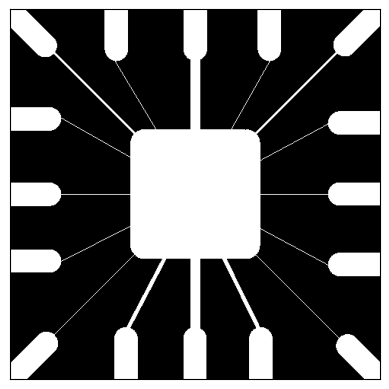


침식1 연산 후


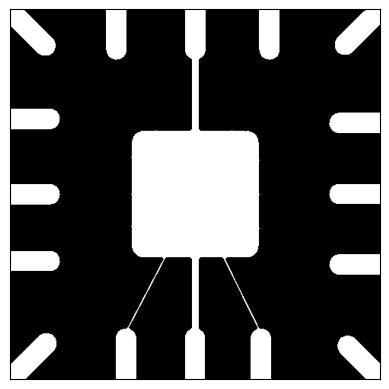


침식2 연산 후


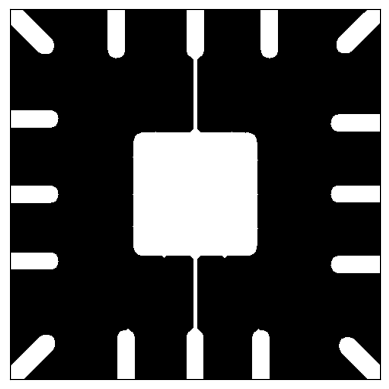


팽창1 연산 후


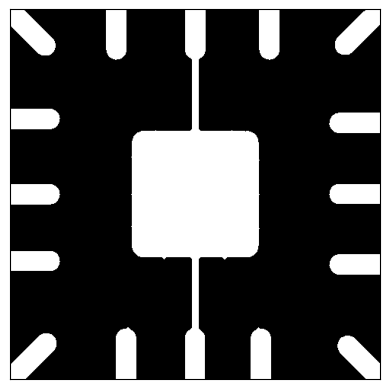


팽창2 연산 후==>최종


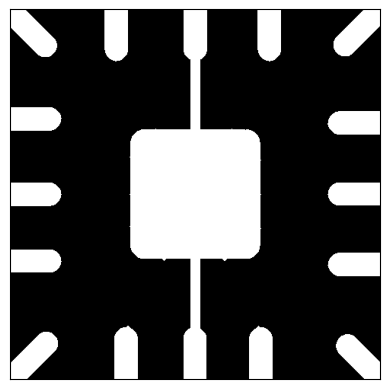

In [ ]:
#가장 거슬리는 중앙선 이외의 주변의 얇은 선을 없애고자 한다.

img_path='/content/drive/MyDrive/Colab Notebooks/CV/img/wirebond.tif'

img=cv.imread(img_path,cv.IMREAD_UNCHANGED)


print("\n원본영상")
t,bin_img=cv.threshold(img[:,:],0,255,cv.THRESH_BINARY+cv.THRESH_OTSU)
plt.imshow(bin_img,cmap='gray'),plt.xticks([]),plt.yticks([])
plt.show()



se=np.uint8([[0,0,1,0,0],			# 구조 요소
            [0,1,1,1,0],
            [1,1,1,1,1],
            [0,1,1,1,0],
            [0,0,1,0,0]])


#1차적으로 얇은 선을 없앤 후
print("\n침식1 연산 후")
bin_img=cv.erode(bin_img,se,iterations=1)	# 침식
plt.imshow(bin_img,cmap='gray'), plt.xticks([]), plt.yticks([])
plt.show()

#2차적으로 그 다음 두꺼운 선을 없앴다.(없애질때까지 진행했음)
print("\n침식2 연산 후")
bin_img=cv.erode(bin_img,se,iterations=1)	# 침식
plt.imshow(bin_img,cmap='gray'), plt.xticks([]), plt.yticks([])
plt.show()

#마지막으로 원래의 선 굵기를 유지하기 위해 두번 팽창을 진행하여 원상복구를 할 것이다.
print("\n팽창1 연산 후")
bin_img=cv.dilate(bin_img,se,iterations=1)	# 팽창
plt.imshow(bin_img,cmap='gray'), plt.xticks([]), plt.yticks([])
plt.show()

print("\n팽창2 연산 후==>최종")
bin_img=cv.dilate(bin_img,se,iterations=1)	# 팽창
plt.imshow(bin_img,cmap='gray'), plt.xticks([]), plt.yticks([])
plt.show()

# HW#2-7
- 아래의 Edge 검출 알고리즘 사용하여 edge를 검출하고, 각각 결과가
어떻게 다른 지 비교하세요.

원본


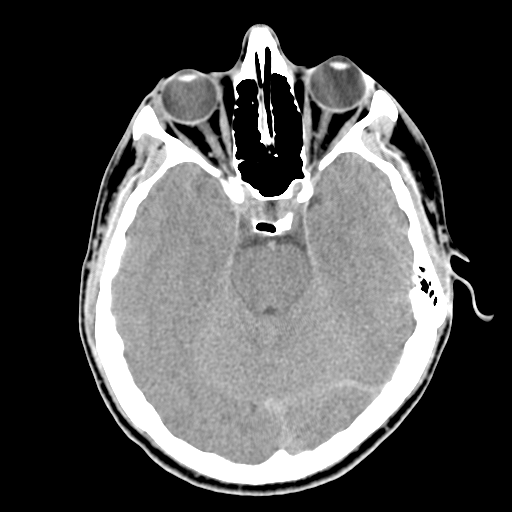

소벨


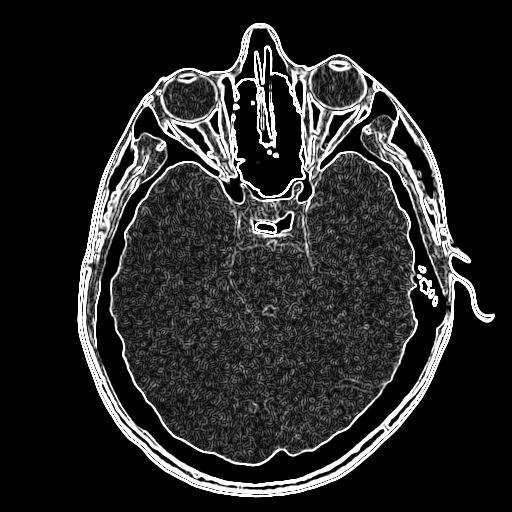

라플라시안


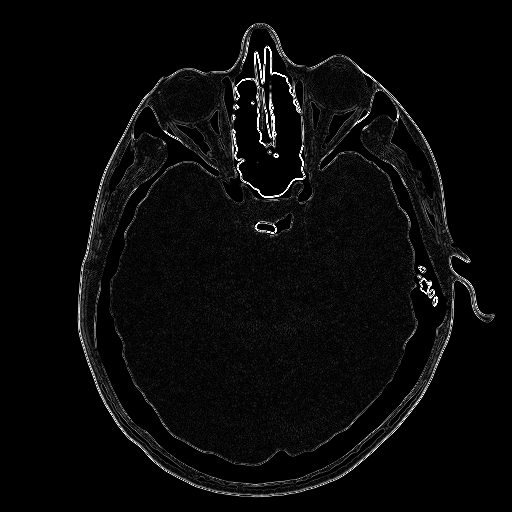

캐니: 100, 200


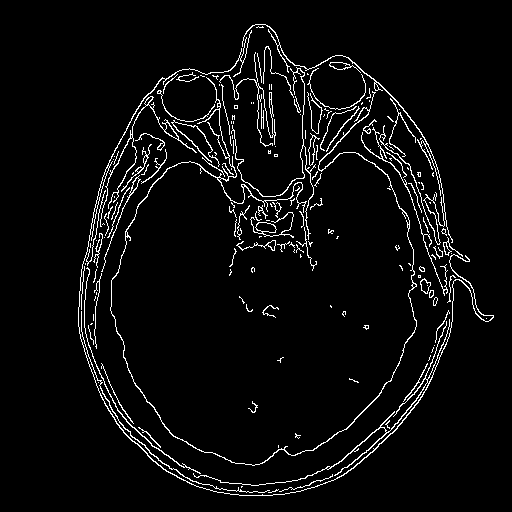

캐니: 100, 150


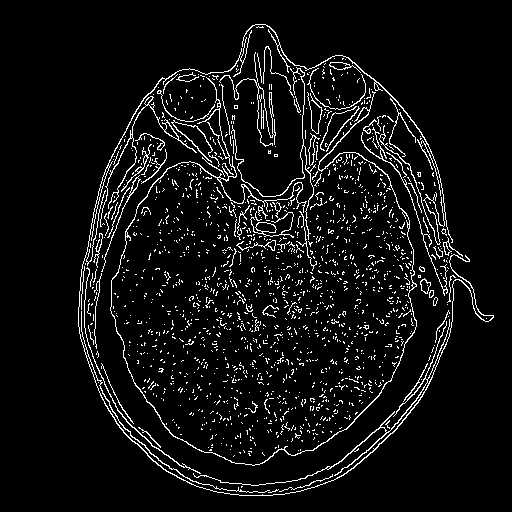

모폴로지 gradient


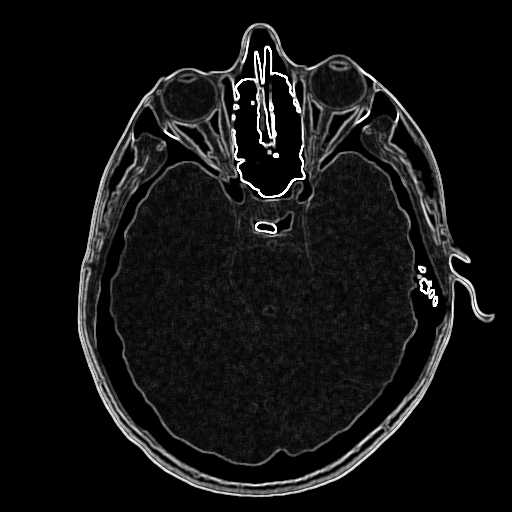

In [ ]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

img_path = '/content/drive/MyDrive/Colab Notebooks/CV/img/CTimg.tif'
img = cv.imread(img_path, cv.IMREAD_GRAYSCALE)

# 1. Sobel
# : x,y방향으로 각각 미분한 값을 magnitude로 전체 경계 세기를 계산함.
# 위 방법을 통해 수직수평의 경계를 측정

sobelx = cv.Sobel(img, cv.CV_64F, 1, 0, ksize=3)
sobely = cv.Sobel(img, cv.CV_64F, 0, 1, ksize=3)
sobel = cv.magnitude(sobelx, sobely)
sobel = np.uint8(np.clip(sobel, 0, 255))

# 2. Laplacian
# : .Laplacian()함수 내부에서 2차 미분을 통해 급경한 경계를 추출
# 소벨과 비교했을때, 급격한 윤곽선만 추출됨을 확인
laplacian = cv.Laplacian(img, cv.CV_64F)
laplacian = np.uint8(np.clip(np.abs(laplacian), 0, 255))

# 3. Canny
# : 가장 윤곽선 다운 윤곽선임
# 내부적으로 가우시안+소벨을 활용하여 경계를 추출하고, 윤곽선의 대비와 얇기를 조절하여
# 뚜렷하게 나타남, 매개변수로 주는 임계값에 따라 추출되는 윤곽선이 달라짐
canny = cv.Canny(img, 100, 200)
canny2=cv.Canny(img,100,110)

# 4. Morphological Gradient
# : 모폴로지의 구조요소를 통해 주변 밝기 차이로 경계 강조
kernel = cv.getStructuringElement(cv.MORPH_RECT, (3, 3))
gradient = cv.morphologyEx(img, cv.MORPH_GRADIENT, kernel)

# 결과 출력
print("원본")
cv2_imshow(img)

print("소벨")
cv2_imshow(sobel)

print("라플라시안")
cv2_imshow(laplacian)

print("캐니: 100, 200")
cv2_imshow(canny)

print("캐니: 100, 120")
cv2_imshow(canny2)

print("모폴로지 gradient")
cv2_imshow(gradient)


# HW#2-8
- 아래의 알고리즘을 사용하여 노이즈라 생각되는 영역을 지우고, 각각 결과가 어떻게 다른 지 비교 분석하세요.
  -  Morphological Smoothing
  - Smoothing Filter


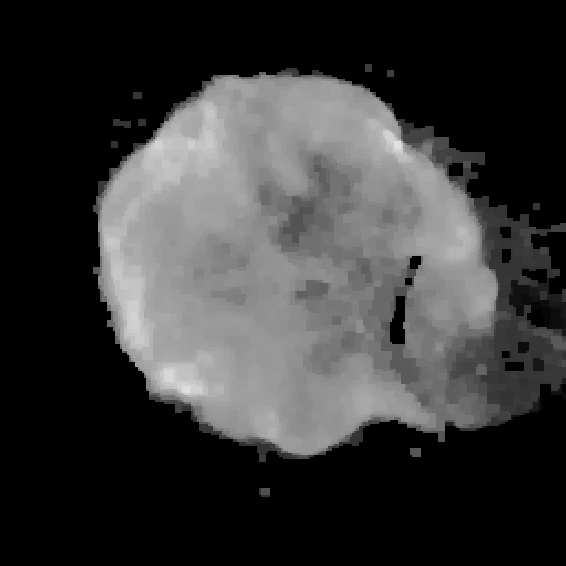

모폴로


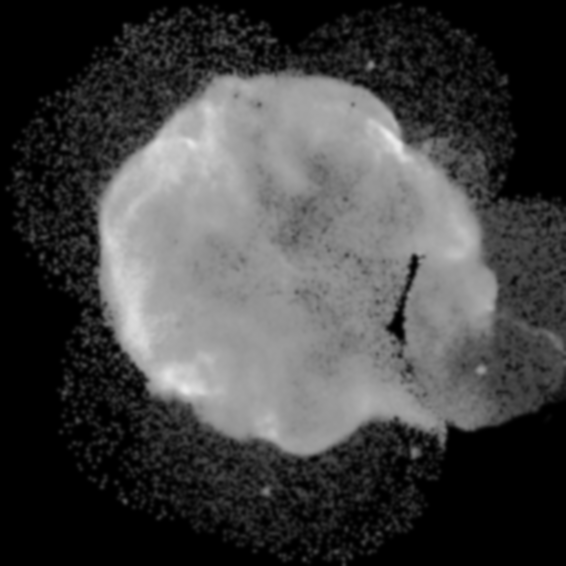

스무딩_가우시안


In [ ]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

# 이미지 불러오기
img_path = '/content/drive/MyDrive/Colab Notebooks/CV/img/smooth.tif'  # 업로드한 이미지 이름으로 바꿔주세요
img = cv.imread(img_path, cv.IMREAD_GRAYSCALE)

# 1) 모폴로지 스무딩
# 열림 연산과 닫힘 연산을 결합하여 영상 스무딩과 노이즈 제거용 형태학 필터로 사용

kernel = cv.getStructuringElement(cv.MORPH_RECT, (7, 7))  # 형태소 크기 설정
m_smoothing = cv.morphologyEx(img, cv.MORPH_OPEN, kernel)  # 열림
m_smoothing = cv.morphologyEx(m_smoothing, cv.MORPH_CLOSE, kernel)  # 닫힘

# 2) 스무딩 필터_가우시안
# 단순 흐려지는 필터로, 노이즈의 흔적이 남음
gaussian_filter = cv.GaussianBlur(img, (9, 9), 0)

# 결과 출력
cv2_imshow(m_smoothing)
print("모폴로")


cv2_imshow(gaussian_filter)
print("스무딩_가우시안")


# HW#2-9
- 다음 영상을 이진화하되, 수업시간에 배운 2가지 방법을 모두 써보고, 각각의 결과에 대해 비교 분석하세요.

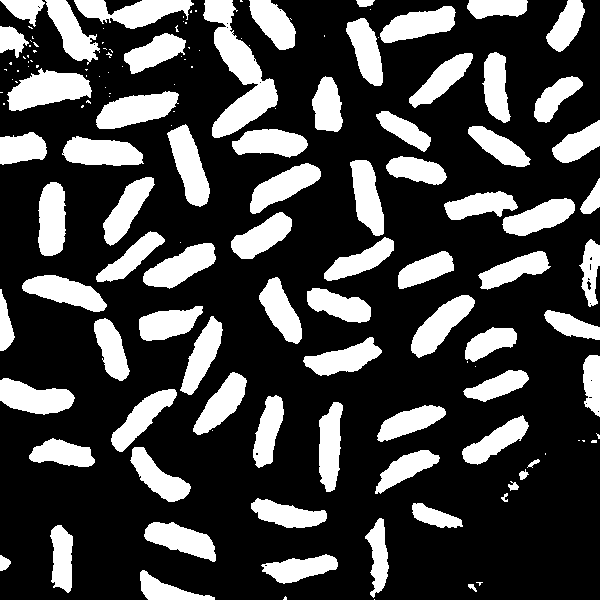

1) Otsu 이진화


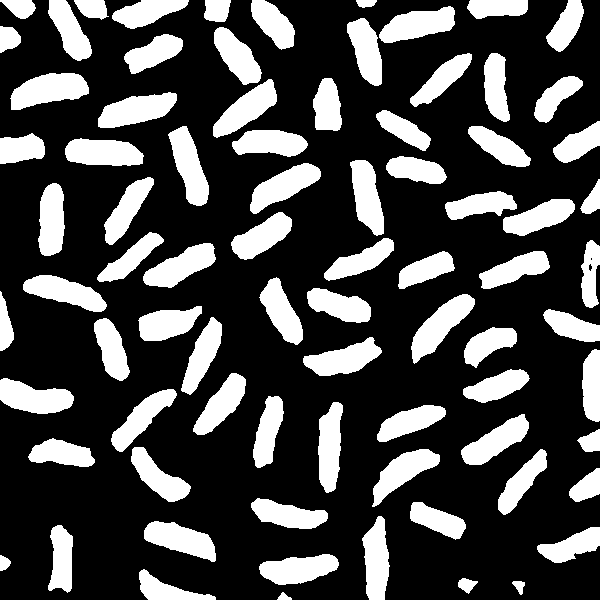

2) Top-hat 변환 결과 영상에 대한 Otsu 이진화


In [ ]:
# 1) 원래 영상에 대한 Ostu 이진화
# 2) Top-hat 변환 결과 영상에 대한 Otsu 이진화
# 위는 수업시간에 배운 2가지 이진화 방법이다,
# 실습 결과 원래 영상에 대한 ostu이진화는 노이즈가 많이 포함된데 반해(비균일한 조명 탓),
# 두번째 결과인 "Top-hat 변환 결과 영상에 대한 Otsu 이진화"는 불균일한 배경을 아예
#빼버리며 이진화를 진행해, 비교적 적은 노이즈와 높은 이진화를 확인할 수 있다.

import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

img_path = '/content/drive/MyDrive/Colab Notebooks/CV/img/rice.tif'
img = cv.imread(img_path, cv.IMREAD_GRAYSCALE)

# 1) Otsu 이진화
ret1, bin1 = cv.threshold(img, 0, 255, cv.THRESH_BINARY + cv.THRESH_OTSU)

# 2) Top-hat 변환 결과 영상에 대한 Otsu 이진화
# 반지름이 40인 디스크 모양의구조 요소를 사용한 열림 연산
kernel = cv.getStructuringElement(cv.MORPH_ELLIPSE, (40, 40))  # 40x40 크기의 디스크 모양 구조 요소
th = cv.morphologyEx(img, cv.MORPH_TOPHAT, kernel)

# Top-hat 변환
blur_tophat = cv.GaussianBlur(th, (5, 5), 0)
#Otsu에 의한 이진화
ret2, bin2 = cv.threshold(blur_tophat, 0, 255, cv.THRESH_BINARY + cv.THRESH_OTSU)

# 결과 출력
cv2_imshow(bin1)
print("1) Otsu 이진화")

cv2_imshow(bin2)
print("2) Top-hat 변환 결과 영상에 대한 Otsu 이진화")


# HW#2-10
- 다음 영상을 Morphology를 적용하여 오른쪽과
같이 분할하세요.


1) 작은 얼룩 제거 (닫힘 연산)


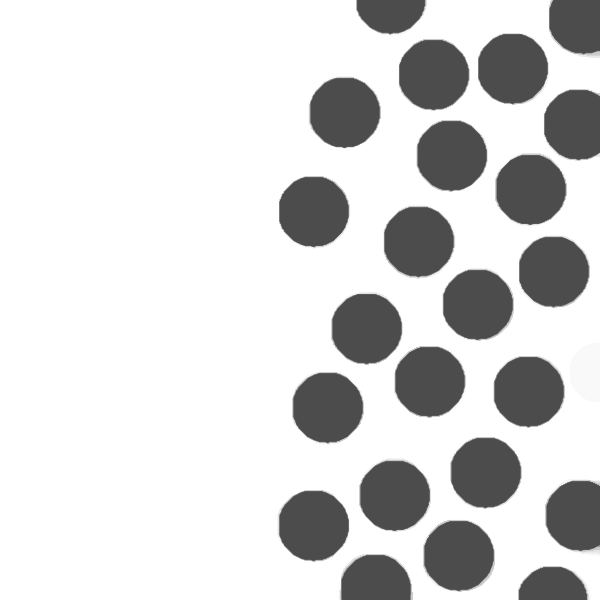

2) 얼룩들 간의 밝은 패치 제거 (열림 연산)


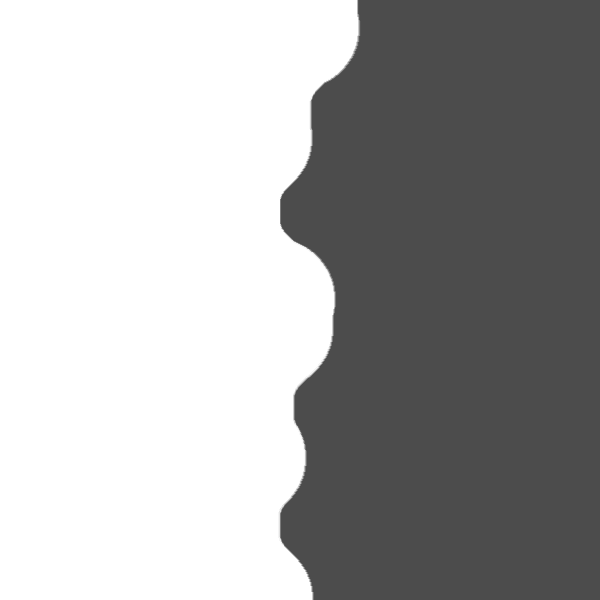

3) 형태학적 기울기 연산으로 경계 추출 (경계 강조)


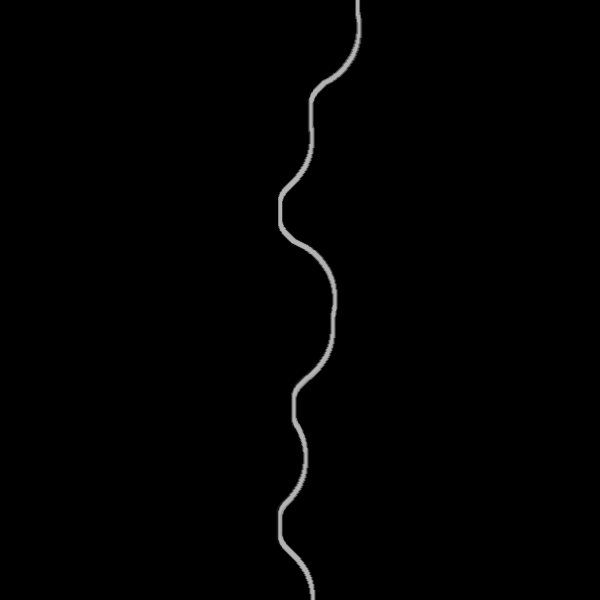

In [ ]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

# 이미지 불러오기
img_path = '/content/drive/MyDrive/Colab Notebooks/CV/img/dot.tif'  # 업로드한 이미지 이름으로 바꿔주세요
img = cv.imread(img_path, cv.IMREAD_GRAYSCALE)


# 1) 작은 얼룩 제거 (닫힘 연산)
# 원형의 모폴로지 마스크를 통해 큰 원형만 걸러지도록 형태소를 정했다.
kernel_1 = cv.getStructuringElement(cv.MORPH_ELLIPSE, (60, 60))
closing = cv.morphologyEx(img, cv.MORPH_CLOSE, kernel_1)

# 2) 얼룩들 간의 밝은 패치 제거 (열림 연산)
# 패치를 제거 할떄도 형태소를 원형으로 설정해 보다더 부드럽게 제거되도록 하였다.
kernel_2 = cv.getStructuringElement(cv.MORPH_ELLIPSE, (120, 120))
opening = cv.morphologyEx(closing, cv.MORPH_OPEN, kernel_2)

# 3) 형태학적 기울기 연산으로 경계 추출 (경계 강조)
# 경계 추출 시 사용되는 형태소의 얇기는 매우 얇게하여 윤곽선만 잡히도록 설정함.
kernel_3 = cv.getStructuringElement(cv.MORPH_RECT, (5, 5))
gradient = cv.morphologyEx(opening, cv.MORPH_GRADIENT, kernel_3)

# 결과 출력

print("1) 작은 얼룩 제거 (닫힘 연산)")
cv2_imshow(closing)

print("2) 얼룩들 간의 밝은 패치 제거 (열림 연산)")
cv2_imshow(opening)

print("3) 형태학적 기울기 연산으로 경계 추출 (경계 강조)")
cv2_imshow(gradient)
